# Housekeeping steps

In [1]:
import cde_reg_functions as cr 

import matplotlib.pyplot as plt
import scipy.signal as sgn
import numpy as np
import os 
import ants
import shutil

# Jupyter specific autoreloading for external functions (in case changes are made)
%load_ext autoreload
%autoreload 2

In [2]:
# Housekeeping
#===================================================================================
Fbase    = '/Users/roschkoenig/Dropbox/Research/1812 Critical Dynamics Epilepsy'
Fscripts = Fbase + os.sep + '04 - Atlas registration'
Fdata    = '/Volumes/MARIANNE/1812 Critical Dynamics in Epilepsy'
Ftemps   = '/Users/roschkoenig/Dropbox/Research/1812 Critical Dynamics Epilepsy Data/Templates'
Zfish    = cr.fishspec(Fdata, prefx='RM')

# Generate intermediate reference

In [3]:
# Load image for intermediate registration and ZBB template
#-----------------------------------------------------------------------------------
frf  = ants.image_read(Ftemps + os.sep + 'Confoc.tif')     # functional reference 
frf.set_spacing([.3,.3,1.])
frf.set_direction(np.array([[-1.,0.,0.],[0.,1.,0.],[0.,0.,-1.]]))

# Set spacing for ZBB data
#-----------------------------------------------------------------------------------
zbb1 = ants.image_read(Ftemps + os.sep + 'HuC-Cer.tif')      # contains eyes and stuff
zbb2 = ants.image_read(Ftemps + os.sep + 'vglut-DsRed.tif')  # is a better match for the glut image above
zbb1.set_spacing([.3,.3,1.])
zbb2.set_spacing([.3,.3,1.])

zbb  = (zbb1 / np.amax(zbb1.numpy()) + zbb2 / np.amax(zbb2.numpy()))
zbb.set_spacing([.3,.3,1.])

## Register confocal image to atlas

In [11]:
frf.set_direction(np.array([[-1.,0.,0.],[0.,1.,0.],[0.,0.,-1.]]))
cf2ref_R = ants.registration(zbb1, frf, type_of_transform = 'QuickRigid')
cf2ref_S = ants.registration(zbb, cf2ref_R['warpedmovout'], type_of_transform = 'SyN')

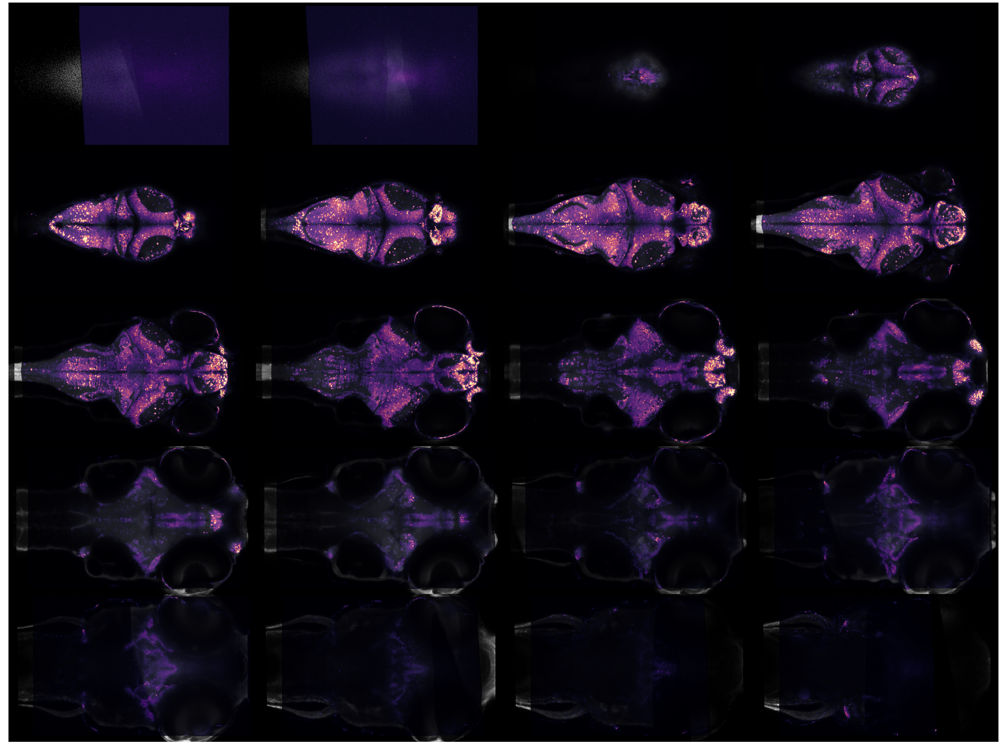

In [14]:
cr.fishplot(zbb1, cf2ref_S['warpedmovout'], al = .8)

In [15]:
Fwarps = Ftemps + os.sep + 'CF2REF'
if not os.path.exists(Fwarps): os.makedirs(Fwarps)
    
shutil.copy2(cf2ref_R['fwdtransforms'][0], Fwarps + os.sep + 'cf2ref_R.mat')
shutil.copy2(cf2ref_R['invtransforms'][0], Fwarps + os.sep + 'ref2cf_R.mat')
shutil.copy2(cf2ref_S['fwdtransforms'][0], Fwarps + os.sep + 'cf2ref_S.nii.gz')
shutil.copy2(cf2ref_S['invtransforms'][0], Fwarps + os.sep + 'ref2cf_S.nii.gz')

'/Users/roschkoenig/Dropbox/Research/1812 Critical Dynamics Epilepsy Data/Templates/CF2REF/ref2cf_S.nii.gz'

# Register mean functional image to confocal image

I found 7226 images
Of these Im loading 10


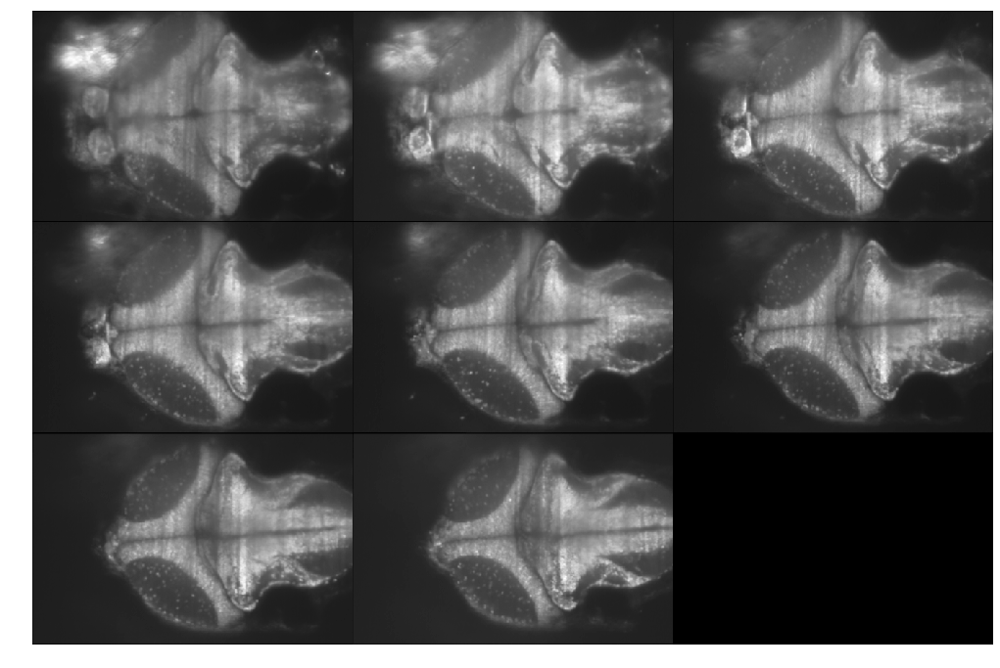

In [4]:
# Generate mean image for registration and load reference
#===================================================================================
imgs = Zfish[0]["Cond"][0]["Tifs"]
Fimg = Zfish[0]["Cond"][0]["Path"]

mimg, imglist = cr.meancalc(imgs, Fimg, noimages = 10, delfirst = False)
mimg.set_direction(np.array([[-1.,0.,0.],[0.,1.,0.],[0.,0.,-1.]]))


In [5]:
mimg.set_spacing([.5,.5,5.])

In [11]:
fun2cf_R = ants.registration(frf, mimg, type_of_transform = 'Rigid', grad_step = .02)
# fun2cf_S = ants.registration(frf, fun2cf_R['warpedmovout'], type_of_transform = 'SyN')

(840, 512, 393)


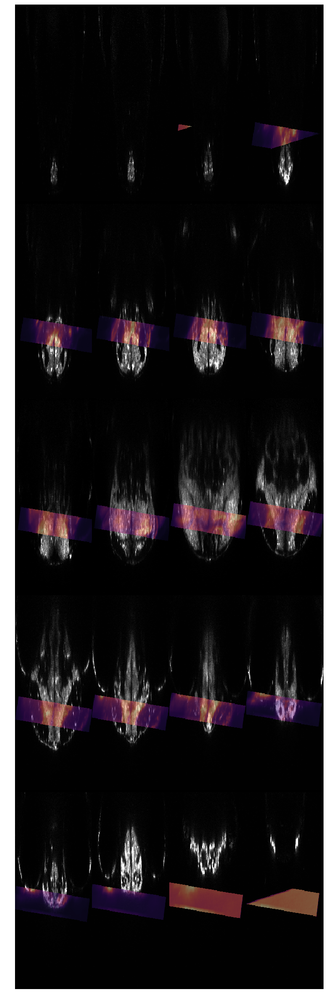

In [41]:
cr.fishplot(frf, fun2cf_R['warpedmovout'], orient = 'coronal')

In [34]:
img.spacing[0] * r[0]

252.0

In [6]:
your_fish_looks = 'L'  # 'L'eft, 'R'ight, 'U'p, 'D'own

In [7]:
ms  = [.4,.4,8]
mimg.set_spacing(list(ms))

if your_fish_looks == 'L': 
    mimg.set_direction(np.array([[-1.,0.,0.],[0.,1.,0.],[0.,0.,-1.]]))    

In [ ]:
fun2cf_R = ants.registration(frf, mimg, type_of_transform = 'SyN', aff_metric = 'GC', 
                             syn_metric = 'CC')
# cf2ref_S = ants.registration(ref, cf2ref_R['warpedmovout'], type_of_transform = 'SyN')

In [ ]:
cr.fishplot(frf,fun2cf_R['warpedmovout'], al = .5)

In [67]:
mrtr_s = ants.registration(ref, mr_r, type_of_transform = 'SyN')
mr_s   = ants.apply_transforms(ref, mr_r, transformlist = mrtr_s['fwdtransforms'])

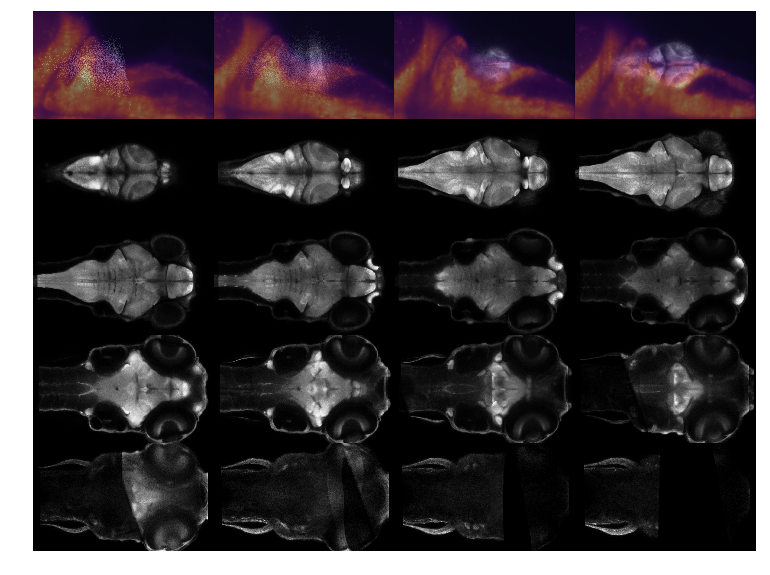

In [68]:
cr.fishplot(ref,mimg)